# ACV Course

## Overview :
Main goal of the course: learn how to manipulate and analyse images OpenCV, focused on skills needed for computer vision outside of machine learning methods.

We start by 2 days on image processing and manipulation :
- Day 1 : Basics of image processing in OpenCV
- Day 2 : Advanced image manipulation

## Program for today

### Morning: Interactive course
* Image input/output
* Manipulating pixels
* Color spaces
* Blurring images
* Edge detection
* Morphological operations
* Thresholding

### Afternoon: Start of the project
**General goal**

Build a webcam filter app like PhotoBooth on Mac OS (demo)

**Today's goals**

Develop some filters:
* Mirror
* Glow
* Sepia
* Black and white
* X-Ray
* Cartoon
* Bonus: Drawing
* Bonus: Thermal camera

## Why OpenCV

* OpenCV = Open Computer Vision Library
* Vision, image & video processing, and machine learning libraries rolled into one
* Multiplatform and multilanguage
* Free and open source
* Used by basically everyone working on Computer Vision

**Applications**

* Tracking and identifying objects (including humans)
* Tracking camera motion
* 3D model reconstruction
* Search by image
* And much more

**Examples of industrial use cases**
* Stitching streetview images together
* Monitoring mine equipment in China 
* Helping robots navigate and pick up objects at Willow Garage
* Detection of swimming pool drowning accidents in Europe
* Running interactive art in Spain and New York
* Checking runways for debris in Turkey
* Inspecting labels on products in factories around the world
* Rapid face detection in Japan

http://opencv.org/about.html

### Useful ressources

Tutorials:
http://docs.opencv.org/3.1.0/d6/d00/tutorial_py_root.html

Reference:
http://docs.opencv.org/2.4/index.html


Community:
http://stackoverflow.com/questions/tagged/opencv

## Preparation

We will use Colab and we will need to download and unzip some files that we will use along the course.

Colab does not keep the files between sessions, so you will probably need to redownload it each time.

In [72]:
# on a pas toutes les sorties de la commande qu'on éxecute
%%capture
!unzip -o data.zip

Essential utility commands

In [73]:
%matplotlib inline # commande qui permet d'avoir le résultat de matplotlib directement dans le notebook

from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]  # Make inline plots larger

import numpy as np
import cv2 # librairie OpenCV

UsageError: unrecognized arguments: # commande qui permet d'avoir le résultat de matplotlib directement dans le notebook


Because we are using Colab, we will need a patch to diplay images

In [74]:
# On charge au préalable les images du dossier data en cliquant sur "importer" dans le dossier à gauche du notebook <-

from google.colab.patches import cv2_imshow # imshow ouvre une fenêtre sur le serveur/pc mais ca marche pas en ligne pour les notebooks

cv2.imshow = lambda title,im: cv2_imshow(im) # permet d'ouvrir la fenêtre sur le notebook

## Image input/output 
### Reading and displaying image with numpy/matplot

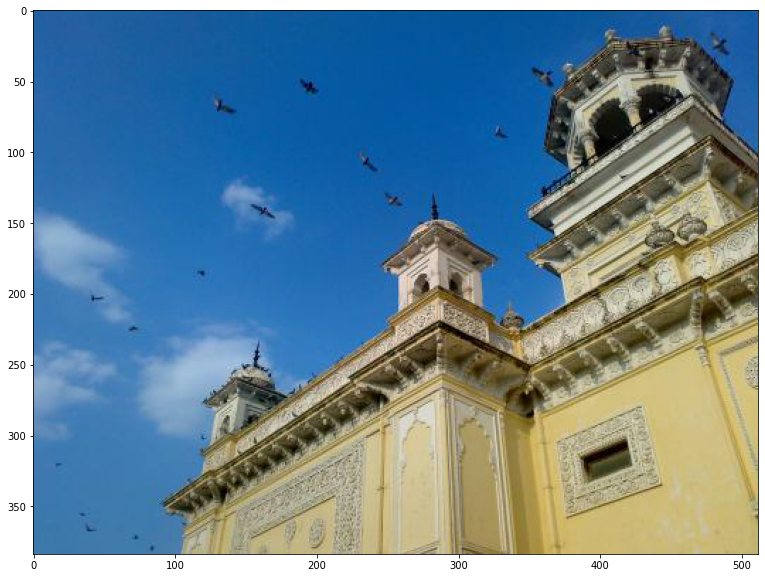

In [75]:
im2disp = plt.imread('home.jpg') # charge l'image avec matplotlib
plt.figure() # crée une nouvelle figure
plt.imshow(im2disp) # affiche l'image dans la figure

### Now the OpenCV way

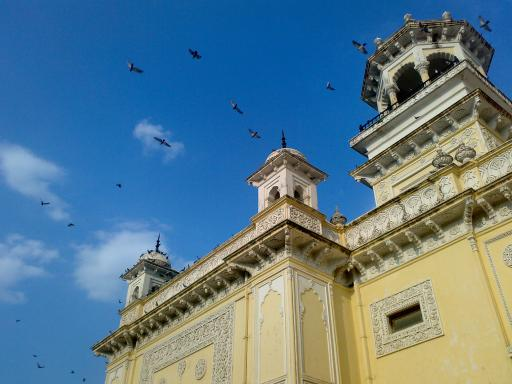

In [76]:
cvim2disp = cv2.imread('home.jpg')
cv2.imshow('HelloWorld', cvim2disp)

### Are numpy.imshow and cv2.imshow the same?

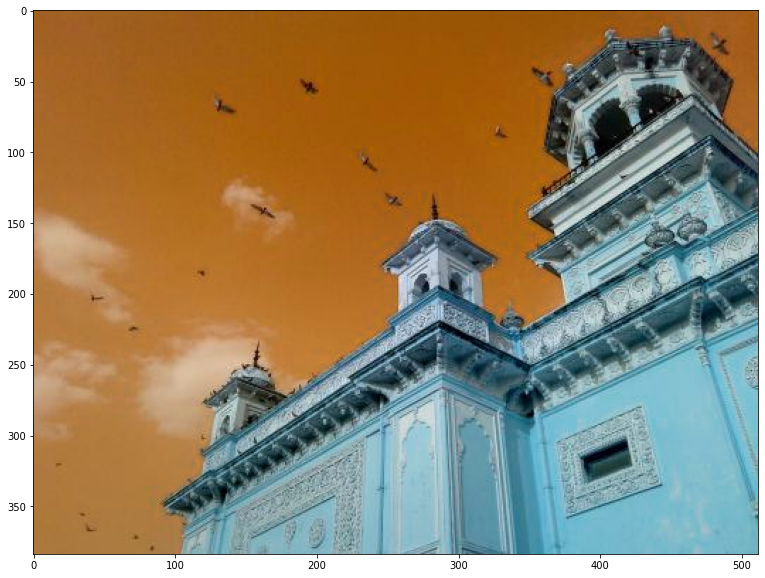

In [77]:
plt.figure()
plt.imshow(cvim2disp)
# image chargée avec OpenCV mais affichée avec matplotlib. L'image est différente.
# les couleurs semblent inversées. OpenCV représente les images en BGR (blue, green, red). Alors que matplotlib les affiche en RGB.
# les canaux bleus et rouges sont inversés dans les deux.

**What happened??**

For historical reasons, OpenCV defaults to BGR format instead of usual RGB

**Solutions:**

Use numpy/OpenCV consistently

or make sure to convert

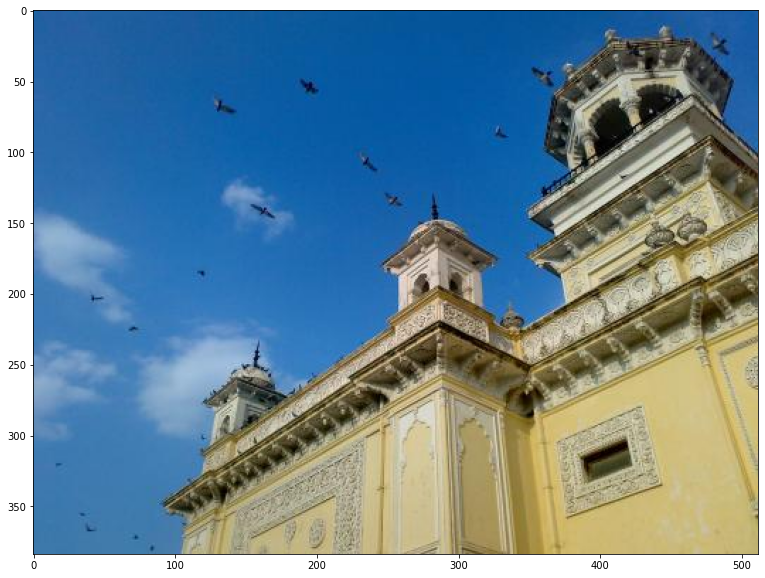

In [78]:
cvimrgb = cv2.cvtColor(cvim2disp,cv2.COLOR_BGR2RGB) # conversion de l'image de BGR en RGB grâce à une constante de OpenCV

#or
#imbgr = cv2.cvtColor(im2disp,cv2.COLOR_RGB2BGR)

plt.figure()
plt.imshow(cvimrgb) # affiche l'image convertie

### Other color spaces (HSL, HSV, etc.)

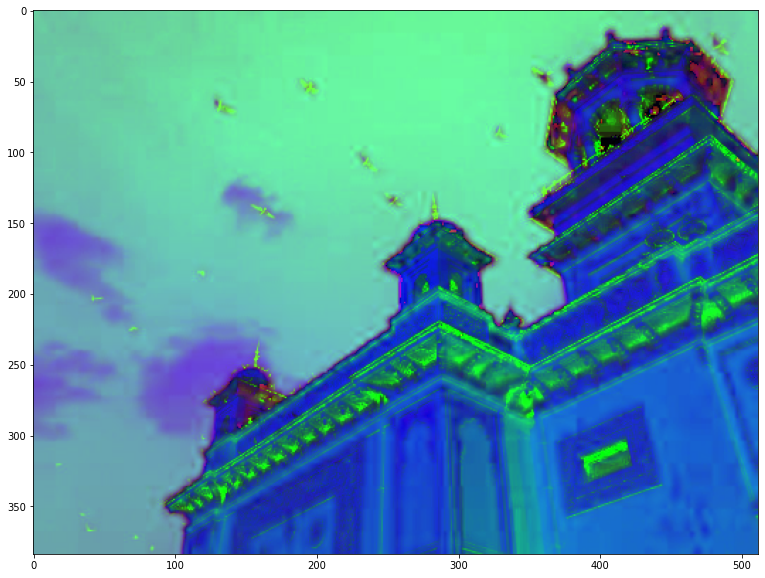

In [79]:
# HSV : décompose l'image en 3 canaux

cvimhsv = cv2.cvtColor(cvim2disp,cv2.COLOR_BGR2HSV)

plt.figure()
plt.imshow(cvimhsv)

**Why does it look like this?**

HSV = Hue, Saturation, Value

https://en.wikipedia.org/wiki/HSL_and_HSV


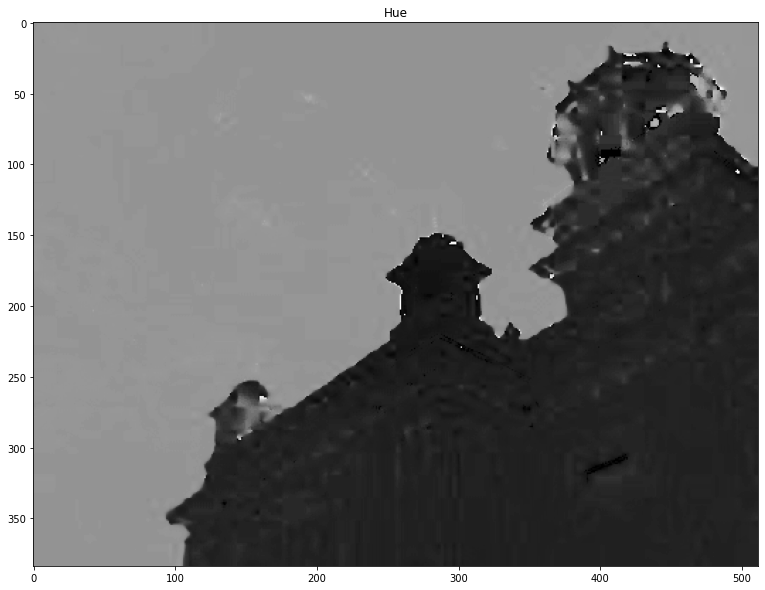

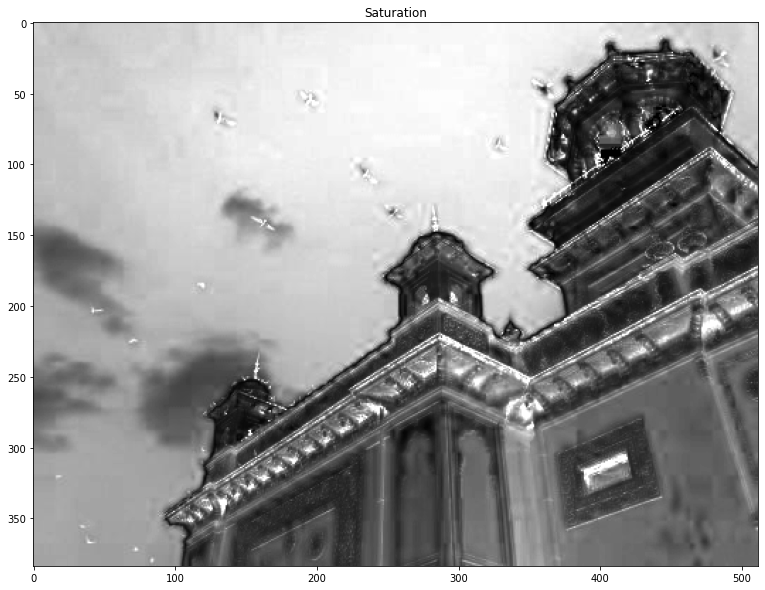

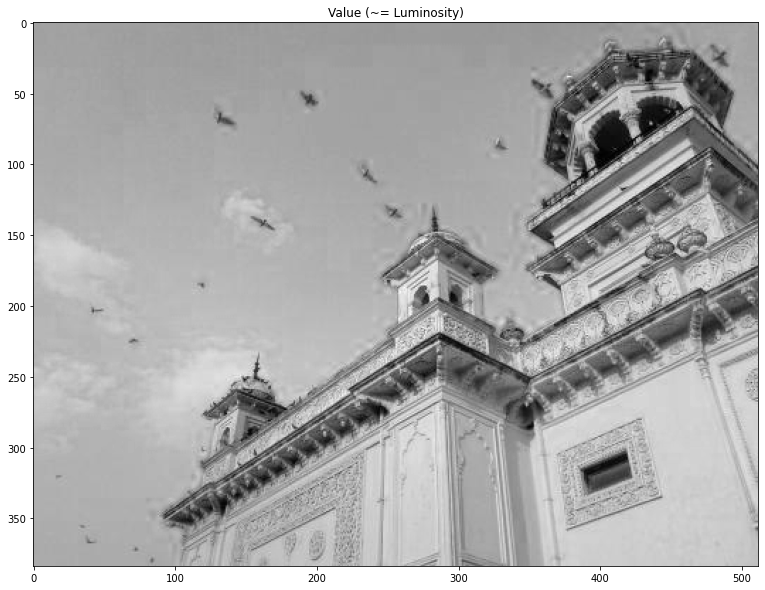

In [80]:
# HSV : décompose l'image en 3 canaux affichés ici séparément

plt.figure()
plt.title('Hue')
plt.imshow(cvimhsv[:, :, 0], cmap='gray') # bat foncé, ciel clair. HUE : couleur (longueur d'onde) donc min=bleu; max=rouge
# image[:,:,0] : slice le np array qui caractérise l'image pour récupérer la 3e dimension qui est le canal. Ici on récupère la 1e colonne
# de la 3e dimension.

plt.figure()
plt.title('Saturation')
plt.imshow(cvimhsv[:, :, 1], cmap='gray') # à quel point la couleur est pétante (plus la couleur est terne, plus elle peut être mélangée
# à du gris, moins elle est blanche. Ici ciel pétant, bat terne.

plt.figure()
plt.title('Value (~= Luminosity)')
plt.imshow(cvimhsv[:, :, 2], cmap='gray') # à quel point l'élément est "lumineux".

### Simple filtering example

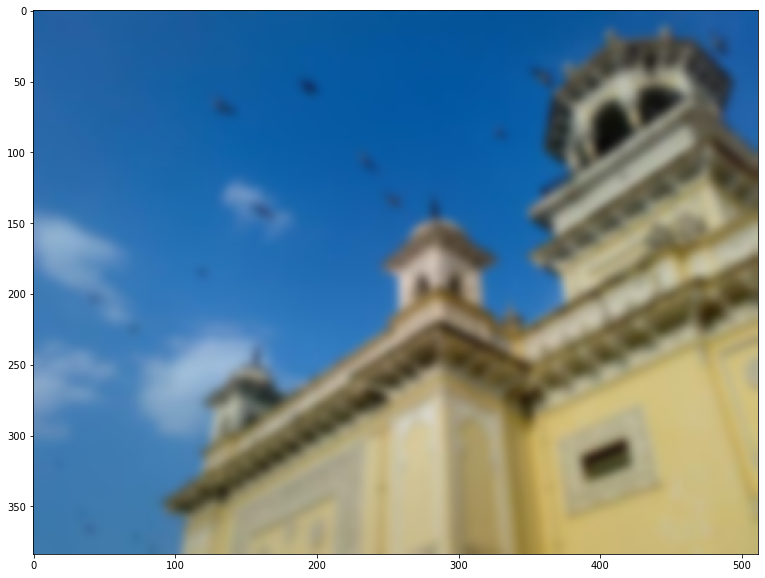

In [81]:
im2disp = plt.imread('home.jpg')

# on crée une nouvelle image en appliquant un flou gaussien. 
blurred = cv2.GaussianBlur(im2disp,(19,19),0) # image à transformer, taille du kernel (tuple) qui donne le degré de floutage,
# déviation standard (calculé sur la taille du kernel = à quel point la gaussienne est large)

# prend le centre de la fenêtre, lui donne un poids très fort, puis tous les pixels autour ont des poids de moins en moins élevés plus on
# s'éloigne du centre.
# les poids donnés sont donc distribués en gaussienne.

# on met des grandes tailles de kernel pour que la gaussienne ne soit pas coupée. On met 0 en std pour ca aussi.
# on mélange les pixels avec les pixels voisins.

plt.figure()
plt.imshow(blurred)

A more general method

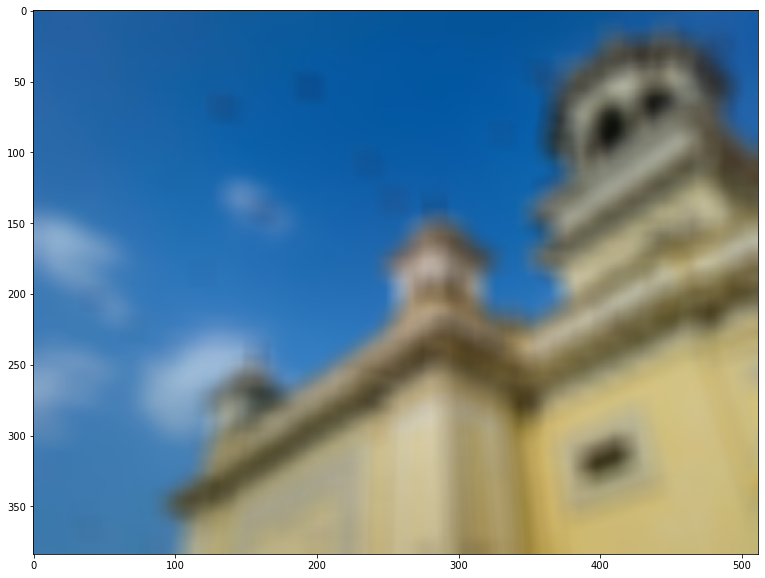

In [82]:
# un filtre : c'est appliqué la même opération sur toute l'image

kernel = np.ones((19,19),np.float32)/361 # on crée un kernel qui mélange les pixel voisins en leur donnant tous la même valeur ici
# cette méthode donne un flou moins précis, moins beau que le flou gaussien

blurred2 = cv2.filter2D(im2disp,-1,kernel) # applique un kernel (une opération) à tous les pixels d'une image

# on peut changer la taille du kernel mais il faut que la somme des éléments du kernel fasse 1. Donc kernel de 5 x 5, il y a 25 valeurs
# on divise toutes les valeurs par 25.

# si la somme dépasse 1, l'image devient trop lumineuse.
plt.figure()
plt.imshow(blurred2)

### Saving an image

In [83]:
cv2.imwrite('mycvimage.png', cvim2disp)
#or
plt.imsave('myimage.png', im2disp)

# enregistre l'image sur le colab (temporaire). Il faut la télécharger dans le dossier pour l'avoir sur le pc.

### Bonus: 1 numpy gotcha for people coming from Matlab

In [84]:
x = np.zeros(5)
y = x

y[1] = 1 # si on change y, on change x aussi car en numpy c'est la référence dans la mémoire qui est utilisée. Les 2 variables pointent vers le même objet (qui a une référence) 

x


array([0., 1., 0., 0., 0.])

**What happened? Why did modifying y change x?**

A: Python copies arrays and other mutable data types by reference by default

Here's what you probably want:

In [85]:
x = np.zeros(5)
y = x.copy() # on copie x pour générer une référence différente. On peut ainsi modifier y sans affecter x.

y[1] = 1

x

array([0., 0., 0., 0., 0.])

##Essential Numpy for OpenCV image work

Let's load a nice picture

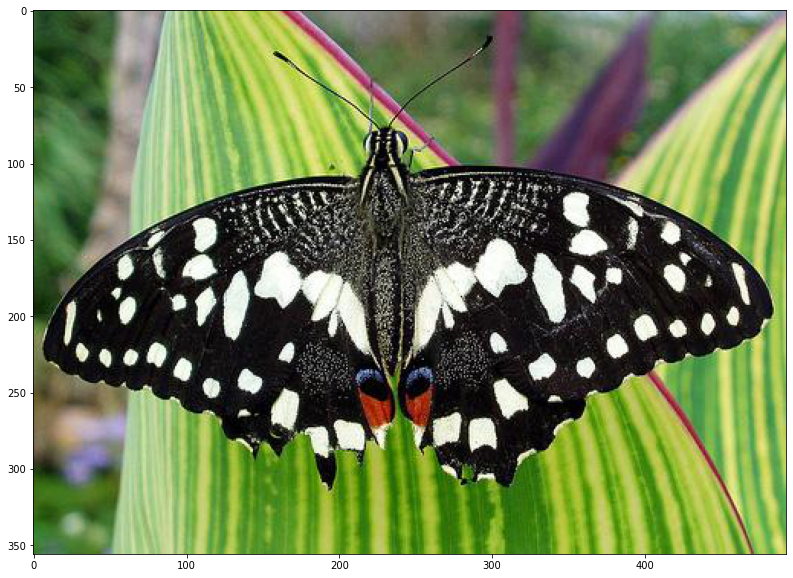

In [86]:
bfly = plt.imread('butterfly.jpg')

plt.figure()
plt.imshow(bfly)

Many algorithms operate on grayscale, and grayscale is easier to work on

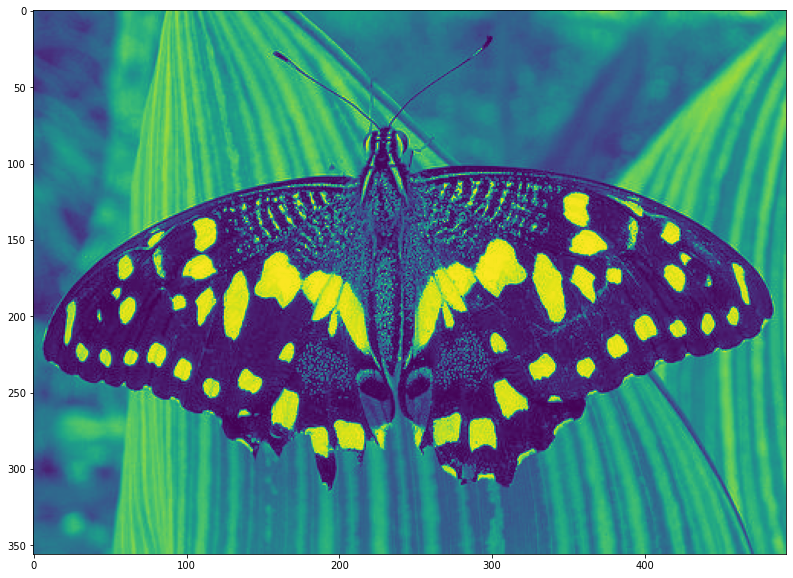

In [87]:
bflygray = cv2.cvtColor(bfly,cv2.COLOR_BGR2GRAY)

plt.figure()
plt.imshow(bflygray) # convertie en échelle GRAY (on supprime la dimension des canaux). Mais l'image n'est pas en N&B à cause de l'affichage plt

You may or may not want the default rainbow map

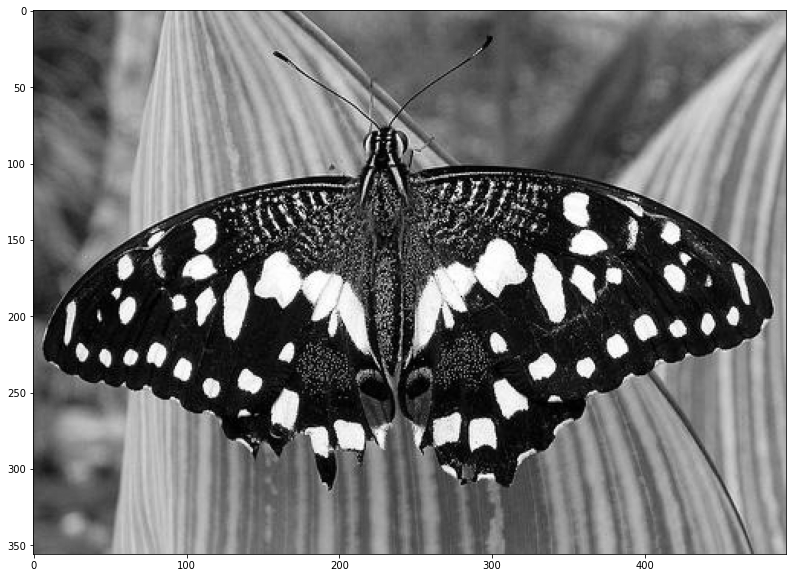

In [88]:
plt.figure()
plt.imshow(bflygray, cmap='gray') # colormap = 'gray' : transforme les valeurs allant du bleu au jaune en valeurs allant du noir au blanc.
# il existe pleins d'autres colormaps, qui ont souvent les mêmes noms que dans matplotlib. Elles sont dispo dans la doc OpenCV.

Let's make sure we understand our data

In [89]:
print(bfly.shape) # il y a 3 dimensions : hauteur, largeur, canaux
print(bflygray.shape) # on a supprimé la dimension des canaux en passant en niveau de gris

(356, 493, 3)
(356, 493)


The format above is (height, width, numchannels):

* If numchannels = 1, as is for grayscale, it is omitted

* For RGB/BGR/HSV color images, numchannels=3

* You could have numchannels=4; this happens for RGBA (Red, Green, Blue, Alpha) images, where Alpha is transparency
  * transparent = 0
  * opaque = 1.0 or 255 (depending on your datatype)

Also remember how to get the data type

In [90]:
bfly.dtype # représente 256 (2 puissance 8) valeurs d'entiers que peuvent prendre les pixels. U : unsigned (que valeurs positives). La plupart des images sont de ce type.

dtype('uint8')

uint8, which means integers in the 0-255 range, is standard for everyday camera images

For scientific purposes, floating point is often used. We typically want these in the 0-1 range:

In [91]:
bflyfloat = bflygray.astype('double') / 255.0 # on divise chaque valeur par la valeur max pour avoir un float entre 0 et 1

bflyfloat.dtype

dtype('float64')

Going back to dimensions, how do we get the image width and height in convenient variables?

In [92]:
height, width = bflygray.shape[0:2]

height, width

(356, 493)

**Always remember that the y dimension comes first**

=> height is before width

**When indexing, [0:2] is only 0 and 1, not 0,1,2**

Python uses a 0:N-1 convention, which is handy when you get used to it, but can trip up newcomers

**What would you expect the following to do?**

In [93]:
print(np.arange(5))

[0 1 2 3 4]


Also, you might see something like this in people's code

In [94]:
height, width = bflygray.shape[:2]

height, width

(356, 493)

It works just the same; when you leave an index blank, it's assumed to be the first or last element, depending on whether it's on the left or right of the : char

In [95]:
bfly.shape[:]

(356, 493, 3)

Also useful to know how to access the last, second to last etc elements

In [96]:
print(bfly.shape[-1])
print(bfly.shape[-2])
print(bfly.shape[-3])

3
493
356


You can probably guess how to extract RGB channels:

In [97]:
redc = bfly[:,:,0]
greenc = bfly[:,:,1]
bluec = bfly[:,:,2]

Note that these will all be singleton in the numchannels dimension

In [98]:
bluec.shape

(356, 493)

**How to recombine?**

First create a new blank image of the proper dimensions

Be careful that the dimensions are given as a tuple rather than individual arguments

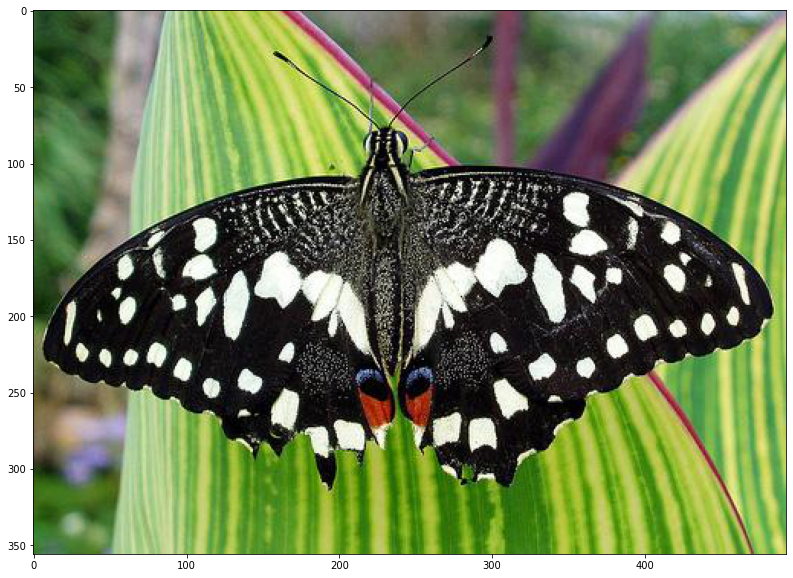

In [99]:
combined = np.zeros((height,width,3), 'uint8') # on crée un numpy array vide, avec des 0, de la taille de l'image originale

# on remplit le np array combined
combined[:,:,0] = redc
combined[:,:,1] = greenc
combined[:,:,2] = bluec

plt.figure()
plt.imshow(combined)

It's easy to extract a region of interest from an image

Let's say we want to examine the butterfly's head more closely;

We can get a bounding box from the figure above

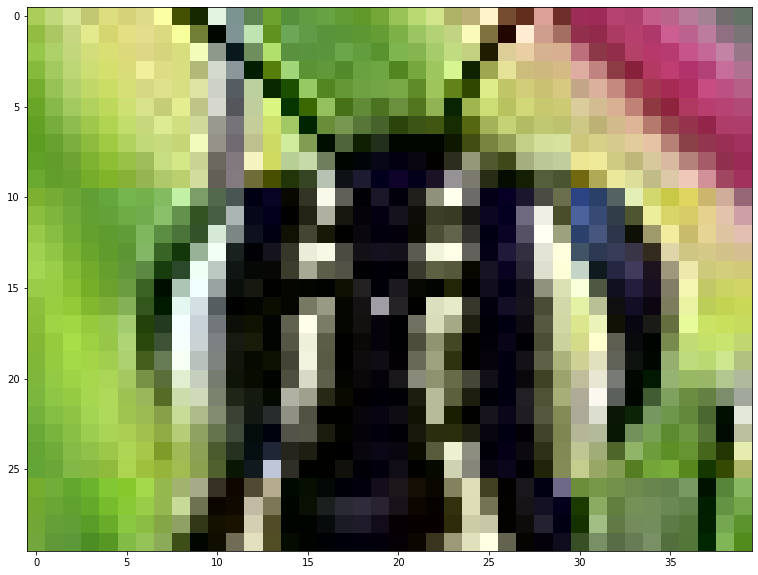

In [100]:
bflyhead = bfly[70:100,210:250] # on est en train de croper une partie de l'image - ici la tête du papillon

plt.figure()
plt.imshow(bflyhead)

Writing to pixels is also simple:

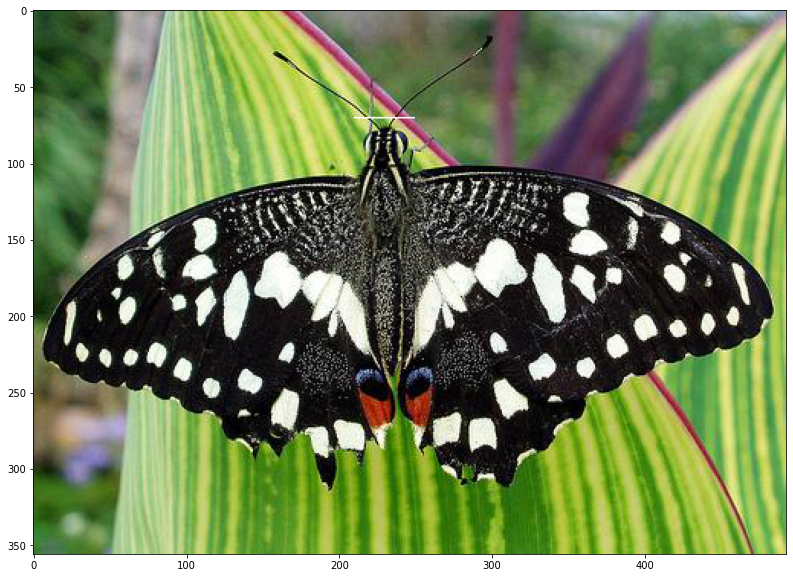

In [152]:
bflyedit = bfly.copy()
bflyedit[70:100,210:250] = 0 # on change les valeurs en 0 de la région sélectionnée - numpy comprend qu'il faut remplacer pour les 3 canaux (=broadcasting)

# si on met un tuple, ex: (255,0,0), numpy remplace toutes les valeurs du 1er canal par 255, et les 2 autres canaux par 0 (devrait donner un carré rouge)

plt.figure()
plt.imshow(bflyedit)

Suggested test-your-knowledge exercises:
1.  Take an image and write a big + sign over it (ie two blocks of black pixels; one extending from top to bottom, one from left to right, but not occupying the whole image)
2.  Create a function that will take in two images and return an image that combines them into a larger side-by-side image
Should be something like


In [102]:
height, width

(356, 493)

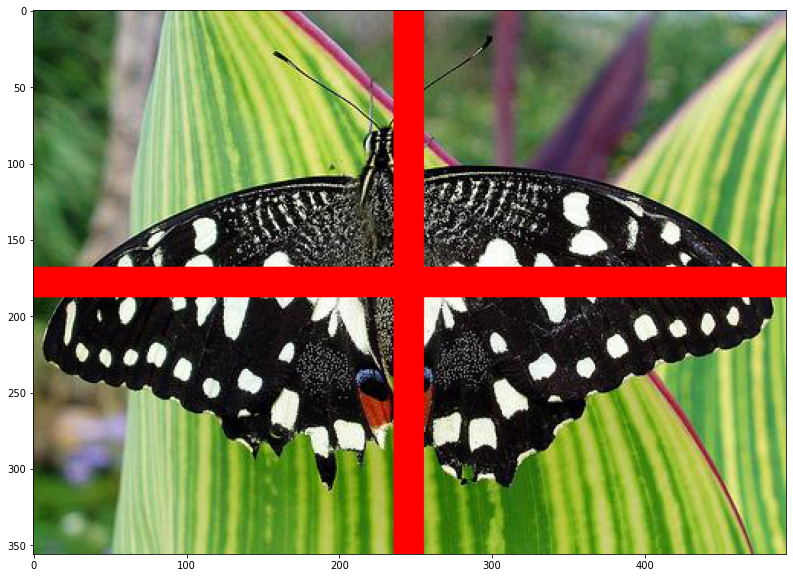

In [103]:
bflyeditsign = bfly.copy()
bflyeditsign[int(height/2-10):int(height/2+10),0:width] = (255,0,0)
bflyeditsign[0:height, int(width/2-10):int(width/2+10)] = (255,0,0)
plt.figure()
plt.imshow(bflyeditsign)

In [107]:
# Create a function that will take in two images and return an image that combines them into a larger side-by-side image Should be something like

def sidebyside(imageleft,imageright):
  ''' Deux images sont placées côte à côte dans une 3e image, créée dans la fonction'''
  newimheight = max(imageleft.shape[0] , imageright.shape[0]) # on prend la taille max entre les 2 images
  newimwidth = imageleft.shape[1] + imageright.shape[1] # on prend la somme des largeurs car on veut mettre les images côte à côte

  newim = np.zeros((newimheight, newimwidth, 3), 'uint8')
  newim[0:imageleft.shape[0],0:imageleft.shape[1]] = imageleft
  newim[0:imageright.shape[0], imageleft.shape[1]:] = imageright

  return newim

#note this won't run as-is

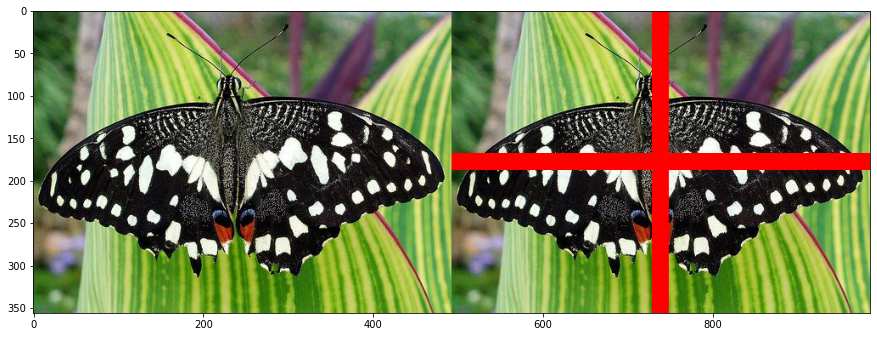

In [108]:
images_sidebyside = sidebyside(bfly,bflyeditsign)
plt.figure()
plt.imshow(images_sidebyside)

In [117]:
###################### EXERCICE : créer un filtre miroir d'une image ######################

# Pour une image : prend la partie gauche de l'image (par exemple), la retourne, et la place à droite. (image symétrique)

def filtre_miroir(image):
  '''Applique un filtre miroir à l'image entrée en input'''
  
  height, width = image.shape[:2]
  image_miroir = np.zeros((height, width, 3), 'uint8')
  demi_image = image[:,0:width//2]
  demi_image_miroir = np.flip(demi_image, axis = 1)
  image_miroir = sidebyside(demi_image, demi_image_miroir)

  return image_miroir


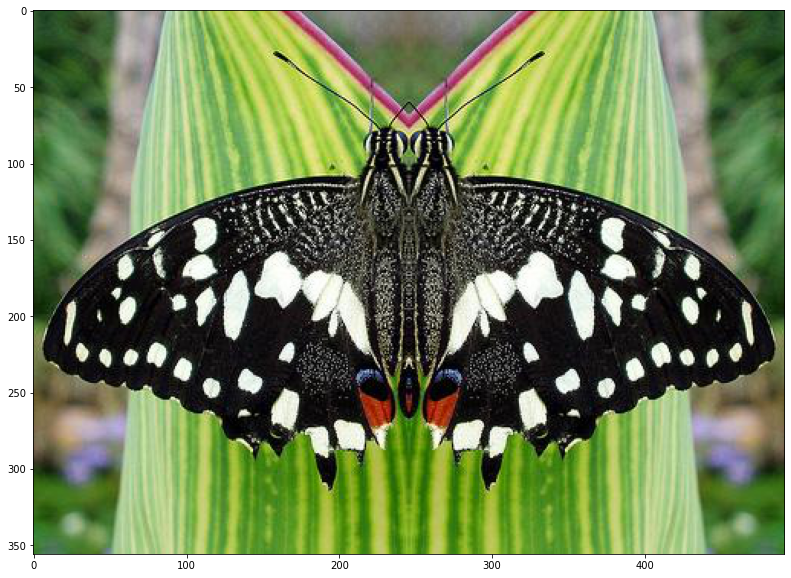

In [119]:
image_miroir = filtre_miroir(bfly)

plt.figure()
plt.imshow(image_miroir)

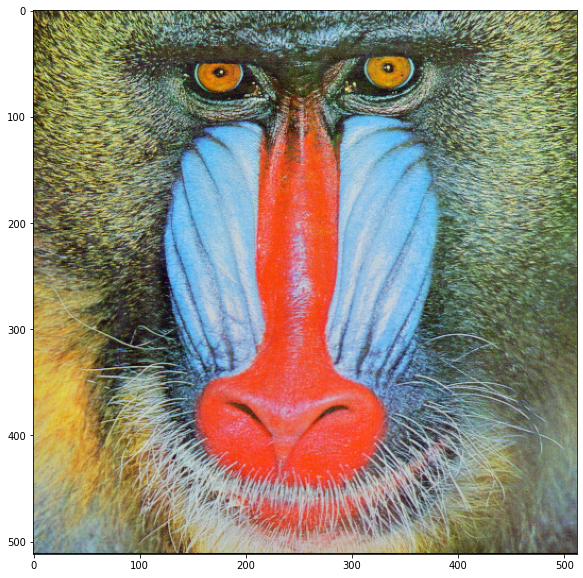

In [120]:
baboon = plt.imread('baboon.jpg')

plt.figure()
plt.imshow(baboon)

In [121]:
def filtre_flou(image):
  '''Applique un filtre flou à l'image entrée en input par flou gaussien'''
  blurred = cv2.GaussianBlur(image,(19,19),0)
  return blurred

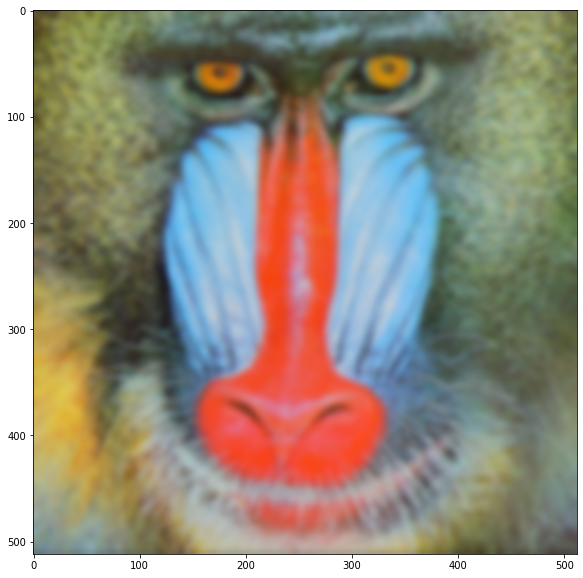

In [122]:
img_flou = filtre_flou(baboon)
plt.figure()
plt.imshow(img_flou)

In [145]:
###################### EXERCICE : Créer un quadrillage 3 x 3 pour appliquer différents filtres à une image ######################


# from itertools import product # module qui permet de faire une double boucle

def quadrillage_filtre(image, filtres:list):
  '''Pour l'image donnée en entrée, la fonction affiche un quadrillage en 3 par 3 de l'image transformée par les filtres.
  Les filtres sont fournis en tant que liste de variables.'''

  newheight = image.shape[0]//3
  newwidth = image.shape[1]//3
  img_resized = cv2.resize(image, dsize=(newwidth,newheight)) # on resize l'image de départ en la divisant par 3. attention : width avant height
  quadrillage = np.zeros((image.shape[0], image.shape[1], 3), 'uint8') #création d'un quadrillage vide


  def no_filter(image): # on crée un filtre pour afficher l'image originale
    return image  

  filtres = filtres[:4] + [no_filter] + filtres[4:] # on veut que l'image originale soit au milieu du quadrillage
  for y in range(3): # pour chaque colonne
    for x in range(3): # pour chaque ligne
      filtre = filtres[3*y+x] # sélection du filtre à appliquer parmi la liste
      img_filtree = filtre(img_resized)
      quadrillage[y*newheight:(y+1)*newheight,x*newwidth:(x+1)*newwidth] = img_filtree

  return quadrillage

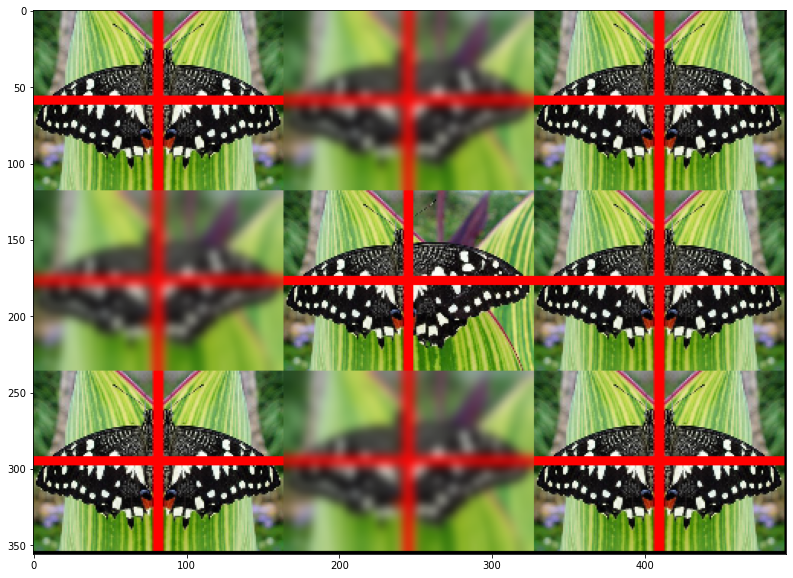

In [148]:
list_filtres = [filtre_miroir,filtre_flou,filtre_miroir,filtre_flou,filtre_miroir,filtre_miroir,filtre_flou,filtre_miroir]
quadrillage = quadrillage_filtre(bflyeditsign, list_filtres)
plt.figure()
plt.imshow(quadrillage)

In [149]:
def filtre_gray(image):
  '''Transforme l'image entrée en input en échelle de gris'''
  grayscale = np.zeros((image.shape[0], image.shape[1], 3), 'uint8') #création d'une image en 3D vide
  grayscale[:,:,0] = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  grayscale[:,:,1] = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  grayscale[:,:,2] = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  return grayscale 

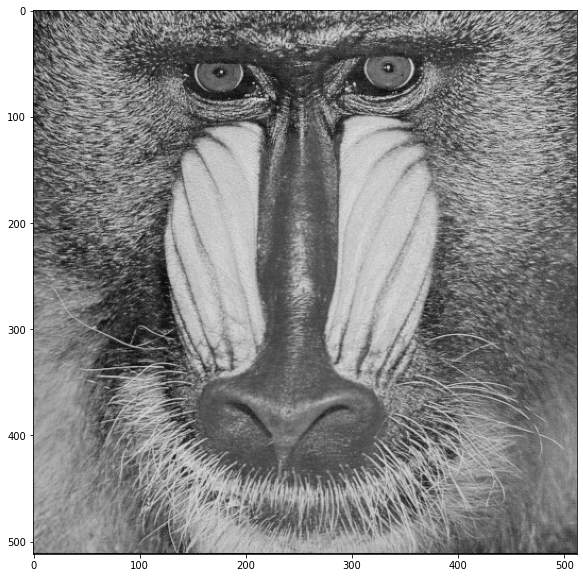

In [151]:
img_gray = filtre_gray(baboon)

plt.figure()
plt.imshow(img_gray)

In [179]:
def filtre_sepia(image):
  '''Applique un filtre sepia à l'image entrée en input'''
  img_sepia = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
  for pixel in img_sepia[:,:,0]:
    pixel[0]=31
  return img_sepia
# NE MARCHE PAS

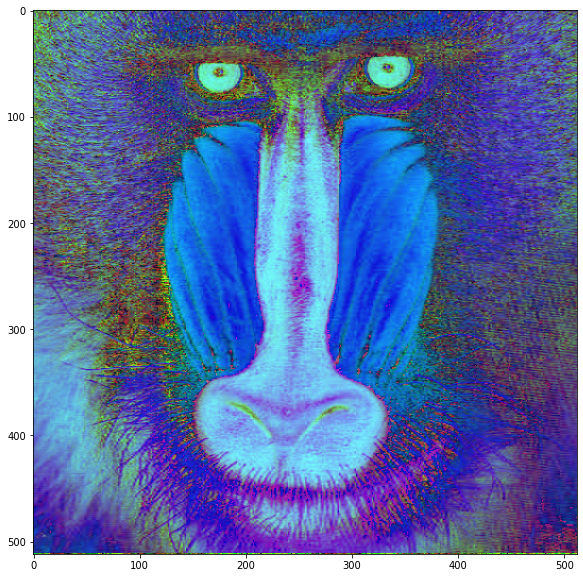

In [180]:
img_sepia = filtre_sepia(baboon)
plt.figure()
plt.imshow(img_sepia)

### Numpy addition vs OpenCV addition

Numpy does modular addition (ie 250+10 = 4, assuming uint8)

OpenCV saturates

In [ ]:
x = np.uint8([250])
y = np.uint8([10])

cv2.add(x,y)

array([[255]], dtype=uint8)

This tends to be what you want for combining images

cv2.subtract works similarly

Of course, images will have to be the same dimension for addition/subtraction to work


### Image weighted blending

Make sure alpha values (or image weights) sum to 1, if you want to "conserve brightness"

alpha for pic1 = 0.7

alpha for pic2 = 1 - 0.7 = 3


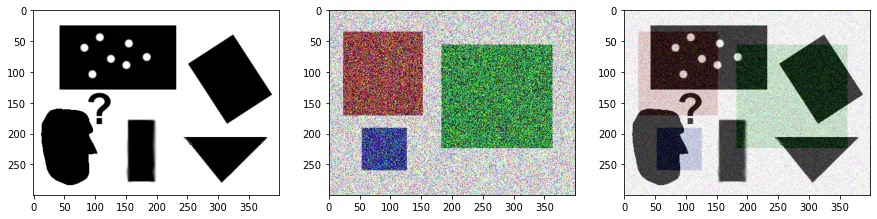

In [ ]:
pic1 = plt.imread('data/pic1.png')
pic2 = plt.imread('data/pic2.png')

dst = cv2.addWeighted(pic1, 0.7, pic2, 0.3, 0)

plt.figure()
plt.subplot(1,3,1)
plt.imshow(pic1)
plt.subplot(1,3,2)
plt.imshow(pic2)
plt.subplot(1,3,3)
plt.imshow(dst)

## Image filtering in OpenCV

### Lowpass filtering

Text(0.5, 1.0, 'Box-car blurred')

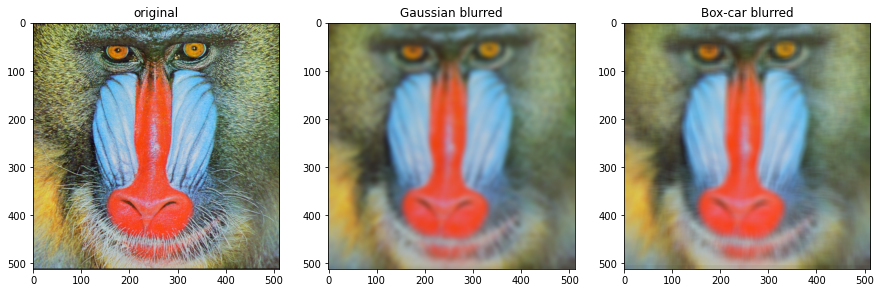

In [ ]:
baboon = imread('data/baboon.jpg')
babblur = cv2.GaussianBlur(baboon, (29,29), 0)

#custom kernel; simple box-car in this case
kernel = np.ones((15,15), np.float32)
kernel /= kernel.size #normalize kernel so as not to scale image intensity

babblur2 = cv2.filter2D(baboon, -1, kernel)

figure()
subplot(1,3,1)
imshow(baboon)
title('original')
subplot(1,3,2)
imshow(babblur)
title('Gaussian blurred')
subplot(1,3,3)
imshow(babblur2)
title('Box-car blurred')

Filter2D is very general and can do many different things; with the right kernel

You can just as easily do high-pass filtering

### Median blurring

Smoothing filter while preserving edges

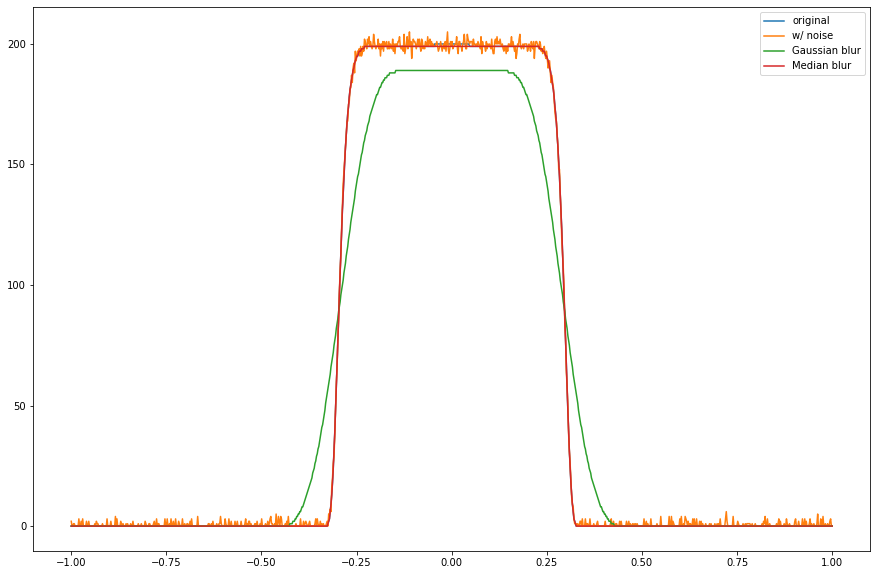

In [ ]:
t = linspace(-1.0,1,1000)
y =  200* (exp(-(t/0.3)**20)  )
yn = y + 200*random.normal(scale=0.01,size=t.shape)
yn[yn<0]=0
y = y.astype(uint8)
yn = yn.astype(uint8)

plt.figure()
plt.plot(t, y)
 
plt.plot(t, yn)
 
ygb = cv2.GaussianBlur(y,(199,199),0)
plt.plot(t, ygb)
 
ymb = cv2.medianBlur(y,199)
plt.plot(t, ymb)
 
plt.legend(['original', 'w/ noise', 'Gaussian blur', 'Median blur'])

Fun demonstration of median-blur to "cartoonify" a real image

Text(0.5, 1.0, 'cartoonified')

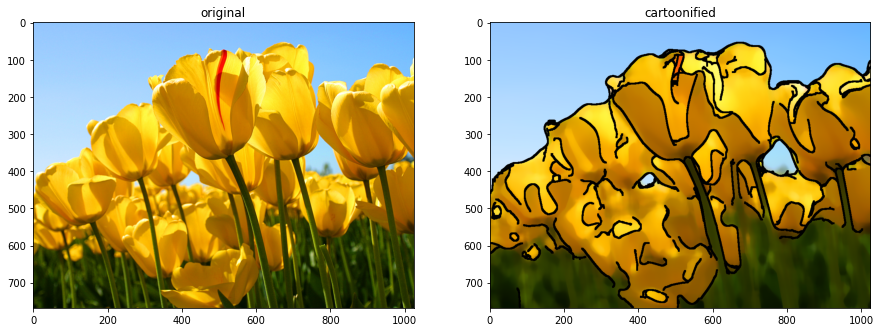

In [ ]:
tulips = imread('data/tulips.jpg')
tublur = cv2.medianBlur(tulips, 29)

# We'll cover Canny edge detection and dilation shortly
edge = cv2.Canny(tublur, 10, 150)
kernel = np.ones((5,5), np.uint8)
edge = cv2.dilate(edge, kernel, iterations = 1)
tublur[edge==255] = 0

plt.figure()

plt.subplot(1,2,1)
plt.imshow(tulips)
plt.title('original')

plt.subplot(1,2,2)
plt.imshow(tublur)
plt.title('cartoonified')

### Highpass filtering and edge-detection

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/2/20/%C3%84%C3%A4retuvastuse_n%C3%A4ide.png/500px-%C3%84%C3%A4retuvastuse_n%C3%A4ide.png">

Basic high-pass filtering example

High-pass filtering responds to derivatives, or spatial changes in images

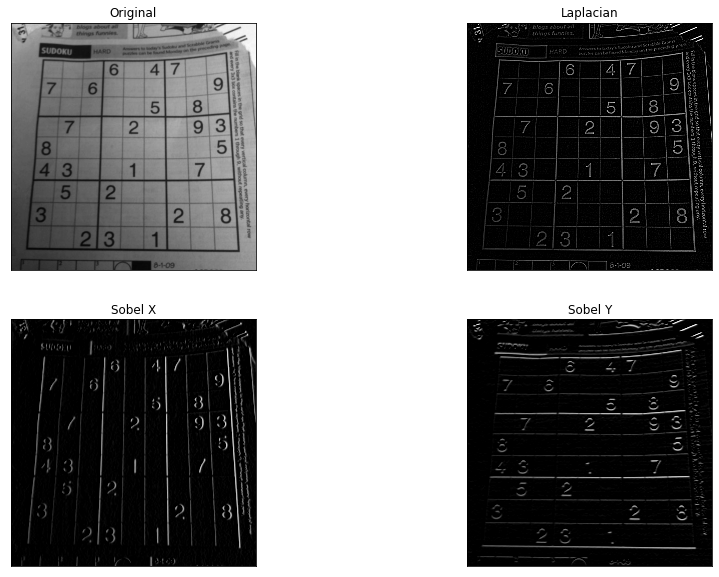

In [ ]:
img = cv2.imread('data/sudokubig.jpg', cv2.IMREAD_GRAYSCALE)
 
laplacian = cv2.Laplacian(img, cv2.CV_64F)
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
 
plt.figure()

plt.subplot(2,2,1)
plt.imshow(img, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])

plt.subplot(2,2,2)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian')
plt.xticks([])
plt.yticks([])
plt.clim([0, 45])

plt.subplot(2,2,3)
plt.imshow(sobelx, cmap='gray')
plt.title('Sobel X')
plt.xticks([])
plt.yticks([])
plt.clim([0, 4500])

plt.subplot(2,2,4)
plt.imshow(sobely, cmap='gray')
plt.title('Sobel Y')
plt.xticks([])
plt.yticks([])
plt.clim([0, 4500])

### Canny edge detection

Read about the theory here:

https://docs.opencv.org/4.0.0/da/d22/tutorial_py_canny.html

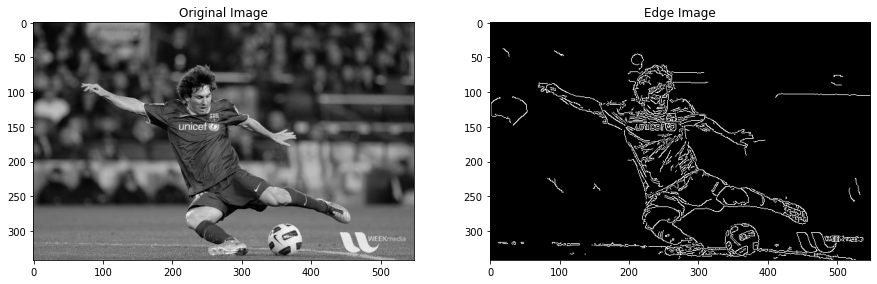

In [ ]:
img = cv2.imread('data/messi.jpg', cv2.IMREAD_GRAYSCALE)
edge = cv2.Canny(img, 100, 200)
 
plt.figure()

plt.subplot(121)
plt.title('Original Image')
plt.imshow(img, cmap='gray')

plt.subplot(122)
plt.title('Edge Image')
plt.imshow(edge, cmap='gray')

### Morphological Operations

Modifying binary masks

Read about the different operations here:

https://docs.opencv.org/4.0.0/d9/d61/tutorial_py_morphological_ops.html#gsc.tab=0

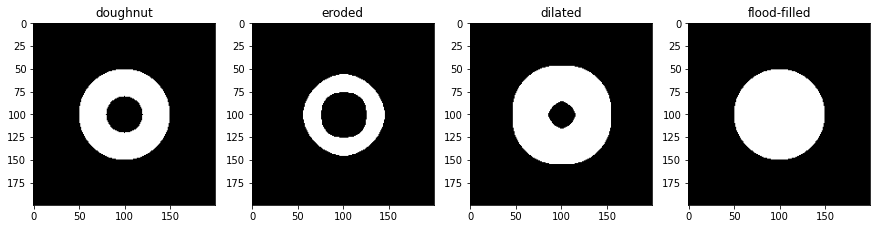

In [ ]:
# Create a doughnut/circle image/mask of 0's and 1's
yy=mgrid[-1:1:0.01,-1:1:0.01][0]
xx=yy.T
circ = 0*xx
circ [xx**2+yy**2 < 0.5**2 ]=1
circ [xx**2+yy**2 < 0.2**2 ]=0
 
# Many different kernel types depending on application
# Let's just stick with a simple box kernel
kernel = ones((10,10), float32)

# Now let's try the some of the different morphological operations
erosion = cv2.erode(circ, kernel, iterations=1)

dilation = cv2.dilate(circ, kernel, iterations=1)

floodfilled = cv2.floodFill(image=circ.astype(uint8).copy(), mask=None, seedPoint=(100,100), newVal=1)
 
plt.figure()

plt.subplot(1,4,1)
plt.title('doughnut')
plt.imshow(circ, cmap='gray')

plt.subplot(1,4,2)
plt.title('eroded')
plt.imshow(erosion, cmap='gray')

plt.subplot(1,4,3)
plt.title('dilated')
plt.imshow(dilation, cmap='gray')

plt.subplot(1,4,4)
plt.title('flood-filled')
plt.imshow(floodfilled[1].astype(float32), cmap='gray')

### Adaptive Thresholding

Compare hard thresholding to adaptive thresholding

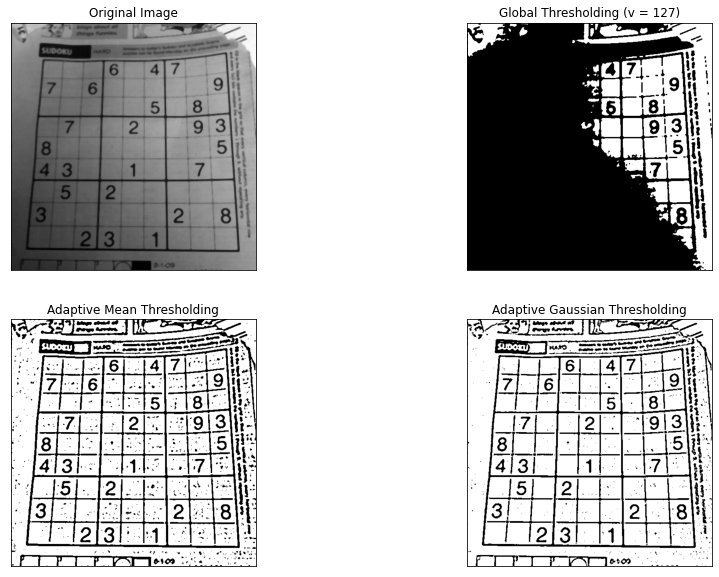

In [ ]:
img = cv2.imread('data/sudokubig.jpg', cv2.IMREAD_GRAYSCALE)
img = cv2.medianBlur(img, 5)

ret, th1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
 
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

plt.figure()
for i, (title, image) in enumerate(zip(titles, images)):
    plt.subplot(2,2,i+1)
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.xticks([])
    plt.yticks([])